<a href="https://colab.research.google.com/github/fatisa2000/ml_project/blob/main/ml_phase2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
pip install patchify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [9]:
from keras.datasets import mnist
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from patchify import patchify
import cv2
from google.colab import files
from google.colab.patches import cv2_imshow
from sklearn.mixture import GaussianMixture
from skimage.util import view_as_windows
import os

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import sys
module_path='/content/drive/MyDrive/Colab Notebooks/corrupted.zip'
sys.path.insert(0,module_path)


In [10]:
path = '/content/drive/MyDrive/Colab Notebooks/corrupted.zip' # Select the path where the data are allocated

#folder_dir = "C:\Users\Iran_soft\Desktop\MNIST\corrupted"
for images in os.listdir(path):

    # check if the image ends with png
    if (images.endswith(".png")):
        print(images)

NotADirectoryError: ignored

X_train: (60000, 28, 28)
Y_train: (60000,)
X_test:  (10000, 28, 28)
Y_test:  (10000,)


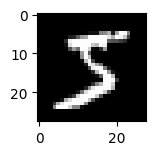

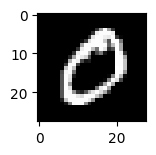

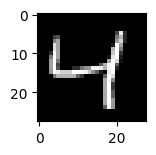

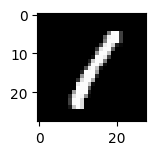

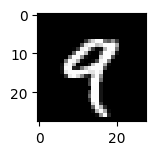

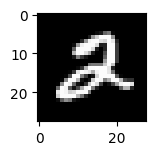

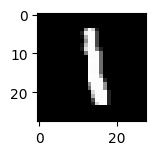

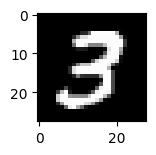

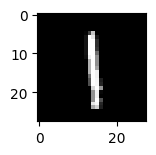

In [ ]:
#phase 2
(train_X, train_y), (test_X, test_y) = mnist.load_data()

print('X_train: ' + str(train_X.shape))
print('Y_train: ' + str(train_y.shape))
print('X_test:  '  + str(test_X.shape))
print('Y_test:  '  + str(test_y.shape))
for i in range(9):
  plt.subplot(330 + 1 + i)
  plt.imshow(train_X[i], cmap=plt.get_cmap('gray'))
  plt.show()


In [ ]:
E=train_X.shape[0]
for i in range(E):
  img=train_X[i]
  patch=patchify(img,(8,8),step=8)
  for k in range(patch.shape[0]):
    for j in range(patch.shape[1]):
      single_patch=patch[k,j,:,:]
      cv2.imwrite('Desktop/images/' + 'image_' + '_'+ str(i).zfill(2) + '_' + str(j).zfill(2) + '.png', single_patch)
      cv2_imshow(single_patch)



In [ ]:
E=train_X.shape[0]
lis=[]
for i in range(E):
  img=train_X[i]
  patch=patchify(img,(8,8),step=8)
  for k in range(patch.shape[0]):
    for j in range(patch.shape[1]):
      single_patch=patch[k,j,:,:]
      singlee_patch=single_patch.reshape(64,1)
      lis.append(singlee_patch)

In [ ]:
lis

[array([[ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [ 0],
        [49]], dtype=uint8),
 array([[  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],

In [ ]:
gm = GaussianMixture()
n=np.array(lis)
m=n.reshape(-1,1)
r=gm.fit(m)
#gm.get_params

In [ ]:
# Define patch size and stride
patch_size = 8
stride = 4

# Extract patches from images
patches = []
for img in train_X:
    for i in range(0, img.shape[0]-patch_size+1, stride):
        for j in range(0, img.shape[1]-patch_size+1, stride):
            patch = img[i:i+patch_size, j:j+patch_size]
            patches.append(patch.flatten())

# Train GMM on flattened patches
gmm = GaussianMixture(n_components=10)
gmm.fit(patches)

# Generate new patches using GMM
new_patches = gmm.sample(10)
new_patches1=np.array(new_patches)
new_patches = new_patches1.reshape(-1, patch_size*patch_size)

# Reshape and display new patches
for i in range(10):
    new_patch = new_patches[i].reshape(patch_size, patch_size)
    plt.imshow(new_patch)
    plt.show()

<ipython-input-4-7d9eddb8f468>:19: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  new_patches = np.array(new_patches).reshape(-1, patch_size*patch_size)


ValueError: ignored

In [71]:
patch_size = 8
stride = 4

# Extract patches from images
patches = []
for img in train_X:
    for i in range(0, img.shape[0]-patch_size+1, stride):
        for j in range(0, img.shape[1]-patch_size+1, stride):
            patch = img[i:i+patch_size, j:j+patch_size]
            #plt.imshow(patch,cmap=plt.get_cmap('gray'))
            #plt.show()
            patches.append(patch.flatten())


In [97]:
# Train GMM on flattened patches
gmm = GaussianMixture(n_components=10)
gmm.fit(patches)

GaussianMixture(n_components=10)

GaussianMixture(n_components=10)

In [99]:
# Generate new patches using GMM
new_patches = gmm.sample(50)
m=new_patches[0]
new_patches1 = np.array(new_patches[0]).reshape(-1, patch_size*patch_size)


In [100]:
np.shape(new_patches1)

(50, 64)

In [101]:
new_patches = np.array(new_patches[0]).reshape(-1, patch_size*patch_size)

# Reshape and display new patches
for i in range(10):
    new_patch = new_patches[i].reshape(patch_size, patch_size)
    plt.imshow(new_patch,cmap=plt.get_cmap('gray'))
    plt.show()